In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb

In [2]:
df = pd.read_parquet('fhvhv_tripdata_2021-01.parquet', engine='pyarrow')

In [3]:
df.head(5)

,hvfhs_license_num,dispatching_base_num,originating_base_num,request_datetime,on_scene_datetime,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,trip_miles,...,sales_tax,congestion_surcharge,airport_fee,tips,driver_pay,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
0,HV0003,B02682,B02682,2021-01-01 00:28:09,2021-01-01 00:31:42,2021-01-01 00:33:44,2021-01-01 00:49:07,230,166,5.26,...,1.98,2.75,NaN,0.00,14.99,N,N,,N,N
1,HV0003,B02682,B02682,2021-01-01 00:45:56,2021-01-01 00:55:19,2021-01-01 00:55:19,2021-01-01 01:18:21,152,167,3.65,...,1.63,0.00,NaN,0.00,17.06,N,N,,N,N
2,HV0003,B02764,B02764,2021-01-01 00:21:15,2021-01-01 00:22:41,2021-01-01 00:23:56,2021-01-01 00:38:05,233,142,3.51,...,1.25,2.75,NaN,0.94,12.98,N,N,,N,N
3,HV0003,B02764,B02764,2021-01-01 00:39:12,2021-01-01 00:42:37,2021-01-01 00:42:51,2021-01-01 00:45:50,142,143,0.74,...,0.70,2.75,NaN,0.00,7.41,N,N,,N,N
4,HV0003,B02764,B02764,2021-01-01 00:46:11,2021-01-01 00:47:17,2021-01-01 00:48:14,2021-01-01 01:08:42,143,78,9.20,...,2.41,2.75,NaN,0.00,22.44,N,N,,N,N


In [4]:
df = df.drop(['hvfhs_license_num',"dispatching_base_num","originating_base_num",'airport_fee',"on_scene_datetime","pickup_datetime","dropoff_datetime","base_passenger_fare","tolls","bcf","sales_tax","congestion_surcharge","tips","driver_pay"], axis=1)

In [5]:
df.head(20)

,request_datetime,PULocationID,DOLocationID,trip_miles,trip_time,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
0,2021-01-01 00:28:09,230,166,5.260,923,N,N,,N,N
1,2021-01-01 00:45:56,152,167,3.650,1382,N,N,,N,N
2,2021-01-01 00:21:15,233,142,3.510,849,N,N,,N,N
3,2021-01-01 00:39:12,142,143,0.740,179,N,N,,N,N
4,2021-01-01 00:46:11,143,78,9.200,1228,N,N,,N,N
5,2021-01-01 00:04:00,88,42,9.725,2162,N,N,N,N,N
6,2021-01-01 00:40:06,42,151,2.469,897,N,N,N,N,N
7,2021-01-01 00:10:36,71,226,13.530,2157,N,N,,N,N
8,2021-01-01 00:21:17,112,255,1.600,446,N,N,,N,N
9,2021-01-01 00:36:57,255,232,3.200,800,N,N,,N,N


In [6]:
df['request_datetime']= pd.to_datetime(df['request_datetime'])

In [7]:
df.head(5)

,request_datetime,PULocationID,DOLocationID,trip_miles,trip_time,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
0,2021-01-01 00:28:09,230,166,5.26,923,N,N,,N,N
1,2021-01-01 00:45:56,152,167,3.65,1382,N,N,,N,N
2,2021-01-01 00:21:15,233,142,3.51,849,N,N,,N,N
3,2021-01-01 00:39:12,142,143,0.74,179,N,N,,N,N
4,2021-01-01 00:46:11,143,78,9.20,1228,N,N,,N,N


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11908468 entries, 0 to 11908467
Data columns (total 10 columns):
 #   Column               Dtype         
---  ------               -----         
 0   request_datetime     datetime64[ns]
 1   PULocationID         int64         
 2   DOLocationID         int64         
 3   trip_miles           float64       
 4   trip_time            int64         
 5   shared_request_flag  object        
 6   shared_match_flag    object        
 7   access_a_ride_flag   object        
 8   wav_request_flag     object        
 9   wav_match_flag       object        
dtypes: datetime64[ns](1), float64(1), int64(3), object(5)
memory usage: 908.5+ MB


In [9]:
df = df.sample(frac=0.25, random_state=42)
df.head(5)

,request_datetime,PULocationID,DOLocationID,trip_miles,trip_time,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
4117959,2021-01-12 13:20:00,181,257,2.340,690,N,N,,N,N
328436,2021-01-01 19:12:57,132,229,16.700,1753,N,N,,N,N
11703194,2021-01-31 14:15:46,68,231,2.070,568,N,N,,N,N
3038135,2021-01-09 15:36:38,233,164,1.060,461,N,N,,N,N
2284945,2021-01-07 16:24:13,216,197,2.051,643,N,N,N,N,N


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2977117 entries, 4117959 to 11723519
Data columns (total 10 columns):
 #   Column               Dtype         
---  ------               -----         
 0   request_datetime     datetime64[ns]
 1   PULocationID         int64         
 2   DOLocationID         int64         
 3   trip_miles           float64       
 4   trip_time            int64         
 5   shared_request_flag  object        
 6   shared_match_flag    object        
 7   access_a_ride_flag   object        
 8   wav_request_flag     object        
 9   wav_match_flag       object        
dtypes: datetime64[ns](1), float64(1), int64(3), object(5)
memory usage: 249.8+ MB


In [11]:
df['request_datetime'] = df['request_datetime'].view('int64') // 10**9

In [12]:
df.head(4)

,request_datetime,PULocationID,DOLocationID,trip_miles,trip_time,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
4117959,1610457600,181,257,2.34,690,N,N,,N,N
328436,1609528377,132,229,16.70,1753,N,N,,N,N
11703194,1612102546,68,231,2.07,568,N,N,,N,N
3038135,1610206598,233,164,1.06,461,N,N,,N,N


In [13]:
unique_values = df['request_datetime'].unique()

# Print the unique values
for value in unique_values:
    print(value)

1610457600
1609528377
1612102546
1610206598
1610036653
1611602428
1610390974
1609505613
1611002340
1612027679
1611301598
1610096597
1611866381
1609526204
1611247165
1610494615
1609959453
1611930111
1611434830
1609781463
1610449871
1609688972
1610529790
1610173195
1611581377
1611327317
1611657382
1610974298
1609683085
1611406843
1610538976
1612030298
1611411782
1610411208
1611487781
1612113789
1610761744
1609735377
1610903177
1610149911
1611069715
1609998569
1610582497
1610629352
1609686517
1610647658
1610234089
1609888687
1612049972
1610155674
1610551467
1611774416
1610643221
1610191774
1609782788
1611009944
1610198382
1611523341
1611681187
1610216206
1611140398
1610342314
1610208463
1610048839
1609592233
1609536330
1611446127
1610783465
1609935169
1609471391
1610001321
1610791918
1609466742
1609693694
1611488084
1611088286
1610391806
1611664507
1610683919
1612102658
1612048727
1611826946
1610812214
1609834934
1611640751
1611773792
1609598788
1611426407
1611471752
1611876988
1611296182

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1610732650
1609483940
1610225786
1610176298
1609585029
1609894080
1610868455
1610990935
1611844656
1610999670
1611577319
1610539800
1610359594
1609650044
1611557187
1611372726
1611356777
1610088208
1610970786
1611604350
1610031794
1610435230
1612066517
1611844763
1610304637
1609632006
1610182117
1610851459
1611230290
1610944688
1611132886
1611085806
1610697021
1611333599
1611315442
1611918402
1610471302
1610826689
1610534551
1611002344
1610568923
1610705880
1612009118
1610548619
1611574283
1611837656
1611246158
1611297452
1611804197
1612099683
1610902314
1610195012
1611101280
1610897980
1611557716
1609672238
1611817338
1610030863
1610347032
1611069337
1611458949
1609962954
1609908414
1612101335
1611578007
1610320497
1610643857
1610642082
1609518470
1610022964
1612089776
1611342692
1611151005
1609871831
1610751124
1609537881
1611390284
1611873272
1611853799
1611668434
1611835604
1611840493
1610532625
1611513782
1610529119
1610820679
1611834234
1610736432
1610272957
1609542314
1611572002

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [35]:
df['shared_request_flag'].replace(['N','Y'],[0,1],inplace=True)
print(df.iloc[:,1].values)

[181 132  68 ... 242 244 231]


In [36]:
df['shared_match_flag'].replace(['N','Y'],[0,1],inplace=True)
print(df.iloc[:,1].values)

[181 132  68 ... 242 244 231]


In [37]:
df['access_a_ride_flag'].replace(['N','Y'],[0,1],inplace=True)
print(df.iloc[:,1].values)

[181 132  68 ... 242 244 231]


In [38]:
df['wav_request_flag'].replace(['N','Y'],[0,1],inplace=True)
print(df.iloc[:,1].values)

[181 132  68 ... 242 244 231]


In [39]:
df['wav_match_flag'].replace(['N','Y'],[0,1],inplace=True)
print(df.iloc[:,1].values)

[181 132  68 ... 242 244 231]


In [40]:
df.head(10)

,request_datetime,PULocationID,DOLocationID,trip_miles,trip_time,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
4117959,1610457600,181,257,2.340,690,0,0,,0,0
328436,1609528377,132,229,16.700,1753,0,0,,0,0
11703194,1612102546,68,231,2.070,568,0,0,,0,0
3038135,1610206598,233,164,1.060,461,0,0,,0,0
2284945,1610036653,216,197,2.051,643,0,0,0,0,0
9302237,1611602428,130,216,1.220,325,0,0,,0,0
3870210,1610390974,7,226,1.960,474,0,0,,0,0
214513,1609505613,232,162,3.004,787,0,0,0,0,0
6577487,1611002340,79,87,3.260,623,0,0,,0,0
11333516,1612027679,213,126,1.920,644,0,0,,0,0


In [41]:
unique_values = df['shared_request_flag'].unique()

# Print the unique values
for value in unique_values:
    print(value)

0
1


In [42]:
unique_values = df['shared_match_flag'].unique()

# Print the unique values
for value in unique_values:
    print(value)

0
1


In [43]:
unique_values = df['wav_request_flag'].unique()

# Print the unique values
for value in unique_values:
    print(value)

0
1


In [44]:
unique_values = df['wav_match_flag'].unique()

# Print the unique values
for value in unique_values:
    print(value)

0
1


In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2977117 entries, 4117959 to 11723519
Data columns (total 10 columns):
 #   Column               Dtype  
---  ------               -----  
 0   request_datetime     int64  
 1   PULocationID         int64  
 2   DOLocationID         int64  
 3   trip_miles           float64
 4   trip_time            int64  
 5   shared_request_flag  int64  
 6   shared_match_flag    int64  
 7   access_a_ride_flag   object 
 8   wav_request_flag     int64  
 9   wav_match_flag       int64  
dtypes: float64(1), int64(8), object(1)
memory usage: 249.8+ MB


In [74]:
# Check for missing values in the specified feature
missing_values = df['shared_request_flag'].isnull()

# Count the number of missing values in the feature
num_missing_values = missing_values.sum()
num_missing_values

0

In [76]:
# Check for missing values in the specified feature
missing_values = df['shared_match_flag'].isnull()

# Count the number of missing values in the feature
num_missing_values = missing_values.sum()
num_missing_values

0

In [77]:
# Check for missing values in the specified feature
missing_values = df['access_a_ride_flag'].isnull()

# Count the number of missing values in the feature
num_missing_values = missing_values.sum()
num_missing_values

0

In [78]:
# Check for missing values in the specified feature
missing_values = df['wav_request_flag'].isnull()

# Count the number of missing values in the feature
num_missing_values = missing_values.sum()
num_missing_values

0

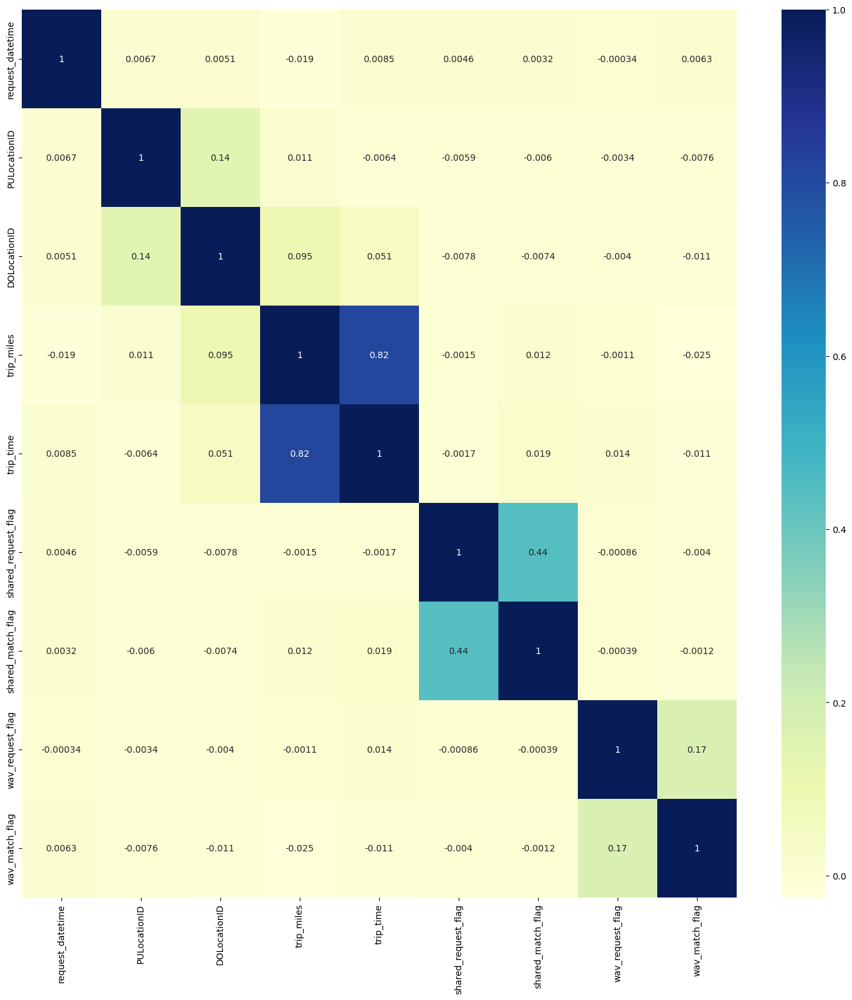

Index(['request_datetime', 'PULocationID', 'DOLocationID', 'trip_miles',
       'trip_time', 'shared_request_flag', 'shared_match_flag',
       'access_a_ride_flag', 'wav_request_flag', 'wav_match_flag'],
      dtype='object')

In [46]:
plt.subplots(figsize=(18,18))
dataplot= sb.heatmap(df.corr(), cmap="YlGnBu",annot=True) 
plt.show()
df.columns

Top  features for target 1: ['wav_match_flag', 'wav_request_flag', 'trip_miles', 'trip_time', 'DOLocationID']


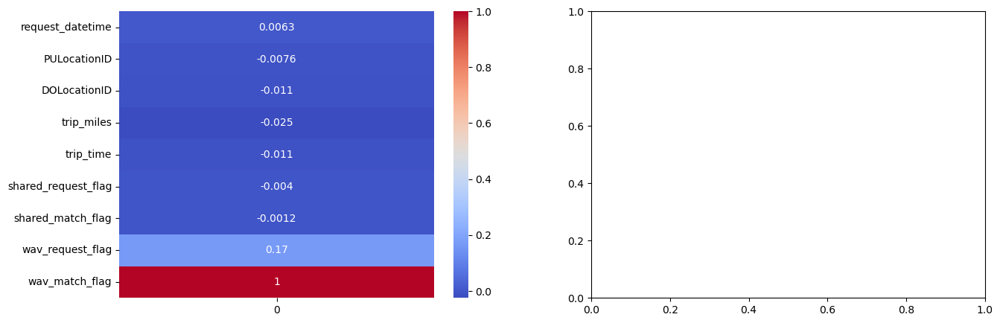

In [47]:
corr_matrix_target1 = df.corrwith(df['wav_match_flag'])

# Plot the heatmaps
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
sb.heatmap(corr_matrix_target1.to_frame(), annot=True, cmap='coolwarm', ax=ax[0])

# Find the features with the highest correlation for each target
top_n_features_target1 = corr_matrix_target1.abs().sort_values(ascending=False).head().index.tolist()

# Print the top features
print(f"Top  features for target 1: {top_n_features_target1}")

In [62]:
X = df[['PULocationID','DOLocationID','trip_miles','trip_time','wav_request_flag','request_datetime',"shared_request_flag","shared_match_flag",]]
y = df['wav_match_flag']

In [63]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,y,test_size=0.3,random_state=7)

In [64]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

In [65]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
# Initialize the logistic regression model
logreg = LogisticRegression()

# Train the model on the training data
logreg.fit(X_train, Y_train)

# Make predictions on the testing data
y_pred = logreg.predict(X_test)

# Evaluate the performance of the model
accuracy = accuracy_score(Y_test, y_pred)
print("Accuracy:", accuracy)
precision = precision_score(Y_test, y_pred)
print("Precision:", precision)

# Calculate recall score
recall = recall_score(Y_test, y_pred)
print("Recall:", recall)

# Calculate F1 score
f1 = f1_score(Y_test, y_pred)
print("F1 score:", f1)

# Calculate confusion matrix
conf_matrix = confusion_matrix(Y_test, y_pred)
print("Confusion matrix:\n", conf_matrix)

Accuracy: 0.9534012737141936
Precision: 0.9967974379503602
Recall: 0.02904806346243584
F1 score: 0.05645106440862409
Confusion matrix:
 [[850272      4]
 [ 41615   1245]]


In [66]:

from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Feature scaling (optional)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Train the logistic regression model
model = LogisticRegression()
model.fit(X_train_scaled, y_train)

# Step 5: Predict probability of cab sharing
y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]  # Probability of positive class (cab sharing)

# Step 6: Evaluate model performance
accuracy = accuracy_score(y_test, y_pred_proba.round())
precision = precision_score(y_test, y_pred_proba.round())
recall = recall_score(y_test, y_pred_proba.round())
roc_auc = roc_auc_score(y_test, y_pred_proba)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("ROC AUC:", roc_auc)

# Step 7: Fine-tune and validate the model as needed


Accuracy: 0.9532366851185038
Precision: 0.9989189189189189
Recall: 0.03212013765773282
ROC AUC: 0.5627948884791633


In [67]:
y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]  # Probability of positive class (cab sharing)


In [68]:
y_pred_proba

array([0.04553896, 0.04940578, 0.04411424, ..., 0.04737313, 0.0485537 ,
       0.0501374 ])

In [69]:

# Assuming you have already obtained the predicted probabilities (y_pred_proba) and the test data (X_test_scaled)

# Create a DataFrame with test samples and predicted probabilities
results_df = pd.DataFrame(X_test, columns=['PULocationID', 'DOLocationID', 'trip_miles', 'trip_time', 'wav_request_flag', 'request_datetime'])
results_df['Predicted_Probability'] = y_pred_proba

# Display the results table
results_df.head(10)


,PULocationID,DOLocationID,trip_miles,trip_time,wav_request_flag,request_datetime,Predicted_Probability
4191649,234,209,2.486,682,0,1610471445,0.045539
1138882,97,87,2.830,848,0,1609755818,0.049406
970127,69,248,3.310,634,0,1609698639,0.044114
4593205,130,131,0.630,150,0,1610563059,0.048328
6113269,152,234,7.189,1702,0,1610892689,0.044743
8616347,47,60,1.220,295,0,1611445167,0.052058
6088381,37,148,5.784,1872,0,1610891308,0.052978
3644066,39,155,5.050,685,0,1610347587,0.043424
5940818,112,28,9.240,959,0,1610841785,0.038389
10579172,232,213,13.320,1309,0,1611898805,0.030890


In [80]:
import os
import sys
import pickle

projectabspathname = os.path.abspath('sharing of cab.pickle')
print(projectabspathname)
projectname = 'sharing of cab.ipynb'
projectpickle = open(str(projectabspathname),'wb')
pickle.dump(projectname, projectpickle)
projectpickle.close()

C:\Users\HP\sharing of cab.pickle
